# Yeast homolog dimension predictions and analysis 
This notebook contains the code to reproduce the analysis and figures for **Figs. 6, S11-14**. In this supporting data repo, we have included a .tar.gz containing all of the sequences used in this analysis, grouped by homolog and pre-organized by domain type. 

We used metapredict to annotated our S. cerevisiae proteins into folded domains and IDRs. We then broadly grouped these proteins into three classes: 
1. Proteins that are predicted to be fully structured (`/full_structure`)
2. Proteins predicted to be fully disordered (`/full_disorder`)
3. Proteins with a mixture of folded and disordered domains (`/mixed`)

For this analysis, we focused on proteins in class 3, but have included the other classes in our supporting data for completeness. Every homologous domain in these proteins are included as both an aligned FASTA (`/msa` subfolder) and non-aligned FASTA (`/raw` subfolder).

This notebook is organized into the following sections:
* Preliminaries (imports and helper functions)
* Dimension and sequence similarity predictions and creating the data frame
* Creating plots using this data frame

Note that we have also included a CSV that includes all necessary information for creating the plots, so it is not necessary to rerun the dimension predictions anew.



## Preliminaries

In [3]:
# General Python packages
import numpy as np
import pandas as pd
import seaborn as sns
import pymsa
from pathlib import Path
from scipy.stats import linregress, mannwhitneyu
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.patches as patches
from matplotlib.backends.backend_pdf import PdfPages

# Public Holehouse lab packages
from afrc import AnalyticalFRC
import protfasta
import sparrow
import sparrow.visualize.sequence_visuals as sequence_visuals

In [4]:
# Useful plotting specs (optional)

# Set such that PDF fonts export in a manner that they
# are editable in illustrator/affinity
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# set to define axes linewidths
matplotlib.rcParams['axes.linewidth'] = 0.5

# this defines some prefactors so inline figures look nice
# on a retina macbook. These can be commented out without any
# issue and are solely asthetic.
%matplotlib inline
%config InlineBackend.figure_format='retina'

# Fonts
font = {'family' : 'arial',
        'weight' : 'normal'}
matplotlib.rc('font', **font)

In [33]:
def parse_title(name):
    if '_' in name:
        return '_'.join(name.split('_')[1:])
    else:
        return name

def get_dim_predictions(seqs, mode):
    if mode not in ['re', 'rg']:
        raise Exception('Mode must be "re" (end-to-end distance) or "rg" (radius of gyration)')

    afrc = []
    pred = []
    lengths=[]
    for s in seqs:
        lengths.append(len(seqs[s]))
        if mode == 're':
            afrc.append(AnalyticalFRC(seqs[s]).get_mean_end_to_end_distance())
            pred.append(sparrow.Protein(seqs[s]).predictor.end_to_end_distance(use_scaled=True))
        elif mode == 'rg':
            afrc.append(AnalyticalFRC(seqs[s]).get_mean_radius_of_gyration())
            pred.append(sparrow.Protein(seqs[s]).predictor.radius_of_gyration(use_scaled=True))

    afrc = np.array(afrc).flatten()
    pred = np.array(pred).flatten()
    lengths = np.array(lengths)
    
    return afrc, pred, lengths

# Get sequence similarity from MSA using pyMSA
def get_similarity_scores(msa, n_seqs):
    # Sum of pairs 
    sop_value = pymsa.SumOfPairs(msa, pymsa.Blosum62()).compute()

    # Star score
    star_value = pymsa.Star(msa, pymsa.Blosum62()).compute()
    
    # Normalize metrics based on number of sequences and length of alignment
    norm_SoP_score = sop_value/(len(msa)*(n_seqs**2 - n_seqs)/2)
    norm_star_score = star_value/(n_seqs*len(msa))

    return norm_SoP_score, norm_star_score

In [16]:
def bootstrap_CIs(x, y, N, CI=0.95):
    domain = np.linspace(np.min(x), np.max(x), 1000)
    best_fit_lines = []
    r_squares = []
    for loop in range(N):
        sample_idx = np.random.choice(len(x), len(x), replace=True).astype(int)
        sample_x = x[sample_idx]
        sample_y = y[sample_idx]
        results = linregress(sample_x, sample_y)
        best_fit_lines.append(results.intercept + domain*results.slope)
        r_squares.append(results.rvalue**2)

    best_fit_lines = np.sort(np.stack(best_fit_lines), axis=0)

    tail = (1-CI) / 2
    upper_bound_idx = int(np.ceil(N*(1-tail))) - 1
    lower_bound_idx = max(int(np.floor(N*tail)) - 1, 0)
    
    upper_CI = best_fit_lines[upper_bound_idx]
    lower_CI = best_fit_lines[lower_bound_idx]
    
    r_squares = np.sort(np.array(r_squares))
    upper_rsquare = r_squares[upper_bound_idx]
    lower_rsquare = r_squares[lower_bound_idx]
    
    return lower_CI, upper_CI, domain, (lower_rsquare, upper_rsquare)

def plot_linear_regression(x, y, axis, CI=0.95, title=None, xlabel=None, ylabel=None, 
                            xlim=None, ylim=None, output=None, show=True):
    result = linregress(x, y)
    lower_CI, upper_CI, domain, r_CIs = bootstrap_CIs(x, y, 1000, CI=CI)

    axis.scatter(x, y, color='k', s=4, rasterized=True)
    label_str = "$R^2$=%.2f" % (result.rvalue**2)
    axis.plot(domain, result.intercept + domain*result.slope, c='darkorange', linestyle='--', label=label_str)
    axis.fill_between(domain, lower_CI, upper_CI, color='orange', alpha=0.3)
    axis.legend(frameon=False)
    if xlabel != None:
        axis.set_xlabel(xlabel)
    if ylabel != None:
        axis.set_ylabel(ylabel)
    if title != None:
        plt.title(title)
    
    if xlim != None:
        axis.set_xlim(xlim)
    if ylim != None:
        axis.set_ylim(ylim)

    plt.tight_layout()
    
    if output != None:
        plt.savefig(output)

    if show:
        plt.show()

## Dimensions and sequence similarity predictions

In [17]:
# Analyze yeast homolog sequences

data = []

# NOTE - you may have to change this path depending on where you extract the .tar.gz
root_directory = Path('../fastas/mixed/raw/')

i = 1
for f in root_directory.iterdir():
    name_fields = f.name.split('_')
    
    if name_fields[1] == 'FD':
        # skip FDs
        continue
    
    name, dom_type, idr_type, start, end, raw  = name_fields
    
    if i % 100 == 0:
        print(i, name, idr_type)
        
    seqs = protfasta.read_fasta(f)
    
    pred_rgs = []
    pred_e2es = []
    idr_seqs = []
    lengths = []
    for s in seqs:
        idr_seqs.append(s)
        lengths.append(len(seqs[s]))
        pred_rgs.append(sparrow.Protein(seqs[s]).predictor.radius_of_gyration(use_scaled=True))
        pred_e2es.append(sparrow.Protein(seqs[s]).predictor.end_to_end_distance(use_scaled=True))
        
    data.append( {'name':name, 'idr_type':idr_type, 'start':int(start), 'end':int(end), 
                  'subseqs':idr_seqs, 'lengths':np.array(lengths).flatten(),
                  'pred_rgs':np.array(pred_rgs).flatten(),
                  'pred_e2e':np.array(pred_e2es).flatten()}
               )
    
    i += 1


100 YBR215W linker
200 YOR196C terminal
300 YNL233W terminal
400 YOR290C linker
500 YOR342C terminal
600 YNL277W linker
700 YAL025C terminal
800 YDL056W linker
900 YFR032C terminal
1000 YJL095W linker
1100 YFL033C linker
1200 YOL083W terminal
1300 YDL216C terminal
1400 YDL207W terminal
1500 YPL146C linker
1600 YMR162C linker
1700 YGR014W terminal
1800 YJL168C linker
1900 YAL051W linker
2000 YNL020C terminal
2100 YNL201C linker
2200 YPL129W linker
2300 YKL015W linker
2400 YGR270W linker
2500 YBR255W terminal
2600 YHR034C linker
2700 YNL097C linker
2800 YBL007C linker
2900 YBL091C terminal
3000 YDL129W terminal


In [34]:
processed_data = []

for i, d in enumerate(data):    
    t = {'name':d['name'], 'idr_type':d['idr_type'],
         'start':d['start'], 'end':d['end'],
         'num_seqs':len(d['lengths']),
         'min_len':min(d['lengths']), 'max_len':max(d['lengths']),
         'len_range': max(d['lengths']) - min(d['lengths']),
         'len_stddev':np.std(d['lengths']),
         're_stddev':np.std(d['pred_e2e']),
         'rg_stddev':np.std(d['pred_rgs'])
        }
    
    processed_data.append(t)
    
df = pd.DataFrame(processed_data, columns=['name', 'idr_type', 'start', 'end',
                                           'num_seqs', 'min_len', 'max_len', 'len_range', 
                                           'len_stddev', 're_stddev', 'rg_stddev'])

In [35]:
# Incorporate IDR sequence aligment similarity information into dataframe
sop_scores = []
star_scores = []
for row in df.iterrows():
    # Read MSA
    file=f'../fastas/mixed/msa/{row[1]["name"]}_IDR_{row[1].idr_type}_{row[1].start}_{row[1].end}_msa.fasta'
    aligned_seqs = protfasta.read_fasta(file, invalid_sequence_action='ignore')
    ids = list(aligned_seqs.keys())
    seqs = list(aligned_seqs.values())
    msa = pymsa.MSA(seqs, ids)
    
    # Get scores
    sop, star = get_similarity_scores(msa, len(ids))
    sop_scores.append(sop)
    star_scores.append(star)

# Add to dataframe
df['SumOfPairs'] = sop_scores
df['StarScore'] = star_scores

In [36]:
# Save to file
df.to_csv('yeast_homolog_data.csv', index=False)

In [37]:
# Get FD length variation
fd_len_stddev = [] 
for f in Path('../fastas/mixed/raw').iterdir():
    if f.name[8:10] == 'FD':
        fd_seqs = protfasta.read_fasta(f)
        
        indiv_seq_lengths = []
        for name, seq in fd_seqs.items():
            indiv_seq_lengths.append(len(seq))
            
        fd_len_stddev.append(np.std(indiv_seq_lengths))

fd_len_stddev = np.array(fd_len_stddev)      
 
# Get FD MSA scores
fd_sop_scores = []
fd_star_scores = []
msa_directory = Path('../fastas/mixed/msa')
for f in msa_directory.iterdir():
    if f.name[8:10] == 'FD':
        aligned_seqs = protfasta.read_fasta(f, invalid_sequence_action='ignore')
        ids = list(aligned_seqs.keys())
        seqs = list(aligned_seqs.values())
        msa = pymsa.MSA(seqs, ids)

        sop, star = get_similarity_scores(msa, len(ids))
        fd_sop_scores.append(sop)
        fd_star_scores.append(star)
        
fd_sop_scores = np.array(fd_sop_scores)
fd_star_scores = np.array(fd_star_scores)

In [38]:
# Get E1A linker sequences
e1a_seqs = protfasta.read_fasta('e1a_linker_sequences.fasta', header_parser=parse_title)
aligned_e1a_seqs = protfasta.read_fasta('aligned_e1a_linker_sequences.fasta', invalid_sequence_action='ignore')

# In Gonzalez-Foutel et al. 2022, they remove a few outlier sequences from their linker dataset. 
# We repeat that here.
reduced_e1a_seqs = {}
for s in e1a_seqs:
    if s[:2] not in ['PA', 'BA']:
        reduced_e1a_seqs[s] = e1a_seqs[s]
        

# E1A sequence similarity
ids = list(aligned_e1a_seqs.keys())
seqs = list(aligned_e1a_seqs.values())
msa = pymsa.MSA(seqs, ids)
e1a_sop, e1a_star = get_similarity_scores(msa, len(ids))

# E1A Re variance
afrc, pred, lengths = get_dim_predictions(reduced_e1a_seqs, 're')
e1a_re_stddev = np.std(pred)
e1a_len_stddev = np.std(lengths)

print(f'Re stddev: {e1a_re_stddev}')
print(f'Len stddev: {e1a_len_stddev}')
print(f'SumOfPairs: {e1a_sop}')
print(f'StarScore: {e1a_star}')
        

Re stddev: 5.358243910935392
Len stddev: 7.7753840562522845
SumOfPairs: -1.0156202493159014
StarScore: -0.022993311036789296


## Plotting data

In [39]:
# Load data
df = pd.read_csv('yeast_homolog_data.csv')

In [40]:
# Filter data to only include homologs where there are enough sequences
# and sufficiently long sequences
df = df[df['num_seqs'] > 10]
df = df[df['min_len'] > 15]

In [41]:
df

,name,idr_type,start,end,num_seqs,min_len,max_len,len_range,len_stddev,re_stddev,rg_stddev,SumOfPairs,StarScore
1,YML029W,linker,478,530,22,30,69,39,10.304155,5.810144,2.459476,-2.463611,-2.042246
2,YER096W,terminal,1,220,26,112,237,125,37.572829,12.680855,5.545110,-1.958685,-1.259369
3,YBR038W,terminal,1,250,19,185,298,113,28.122014,5.869160,2.478187,0.328460,1.258630
4,YHR156C,terminal,1,173,18,131,256,125,26.262681,6.088140,2.729365,-0.833188,0.075275
5,YOL089C,linker,179,230,27,21,272,251,47.660090,16.899942,7.390599,-0.834153,-0.462488
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,YMR280C,linker,143,272,17,88,219,131,32.895977,11.746638,4.974928,-0.726860,0.186110
2996,YCR091W,terminal,1,311,29,292,839,547,101.772449,17.947005,7.425842,-1.269884,-0.680039
2997,YOR113W,terminal,737,914,23,16,321,305,67.803898,23.580918,10.476119,-1.932099,-1.089031
2998,YPL188W,terminal,1,52,20,45,64,19,5.156307,2.643078,1.276678,-0.610811,0.291892


In [42]:
# IDR homologs of interest
Yak1 = df[df['name']=='YJL141C']
Yak1 = Yak1[Yak1['start']==1]
Spt2 = df[df['name']=='YER161C']

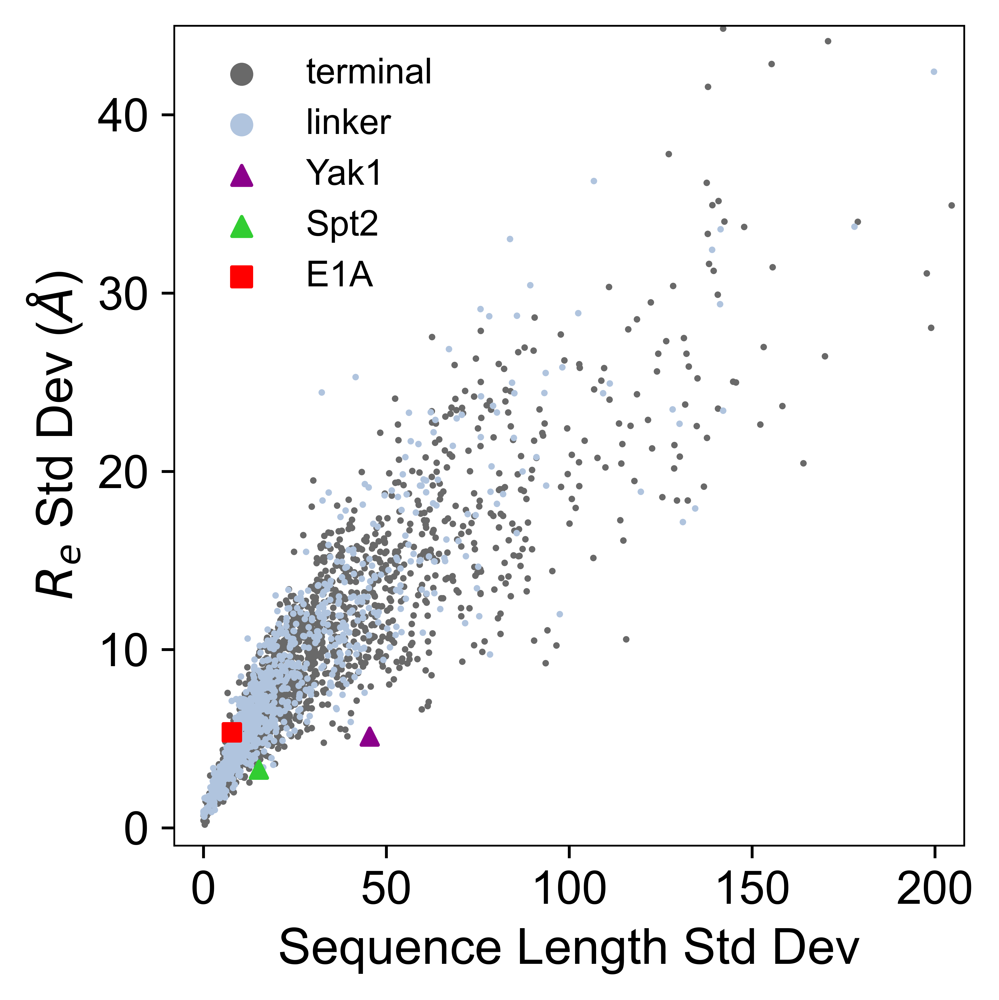

In [43]:
groups = ['terminal', 'linker']

# -- Seq len stddev vs Re stddev (Fig 6B)

fig, ax = plt.subplots(figsize=(4,4),dpi=500)
for g, c in zip(groups, ['dimgrey', 'lightsteelblue']):
    ix = np.where(df.idr_type == g)[0]
    ax.scatter(df.len_stddev.values[ix], df.re_stddev.values[ix], s=0.7, label=g, 
               color=c,rasterized=True)

ax.scatter(Yak1.len_stddev, Yak1.re_stddev, s=22, label='Yak1', 
           c='darkmagenta', marker='^', rasterized=True)
ax.scatter(Spt2.len_stddev, Spt2.re_stddev, s=22, label='Spt2', 
           c='limegreen', marker='^', rasterized=True)

# E1A linker
ax.scatter(e1a_len_stddev, e1a_re_stddev, s=22, label='E1A', c='red', marker='s', rasterized=True)

# Axis limits
ax.set_ylim([-1, 45])
ax.set_xlim([-8, 208])
ax.tick_params(axis='both', which='major', labelsize=13)
plt.xlabel('Sequence Length Std Dev', fontsize=14)
plt.ylabel(r'$R_e$ Std Dev ($\AA$)', fontsize=14)

legend = ax.legend(frameon=False)
for legend_handle in legend.legendHandles:
    legend_handle._sizes = [30]

plt.tight_layout()

# save
# with PdfPages('figures/Re_stddev_vs_seq_length_stddev_wE1A_scatter_Spt2.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()

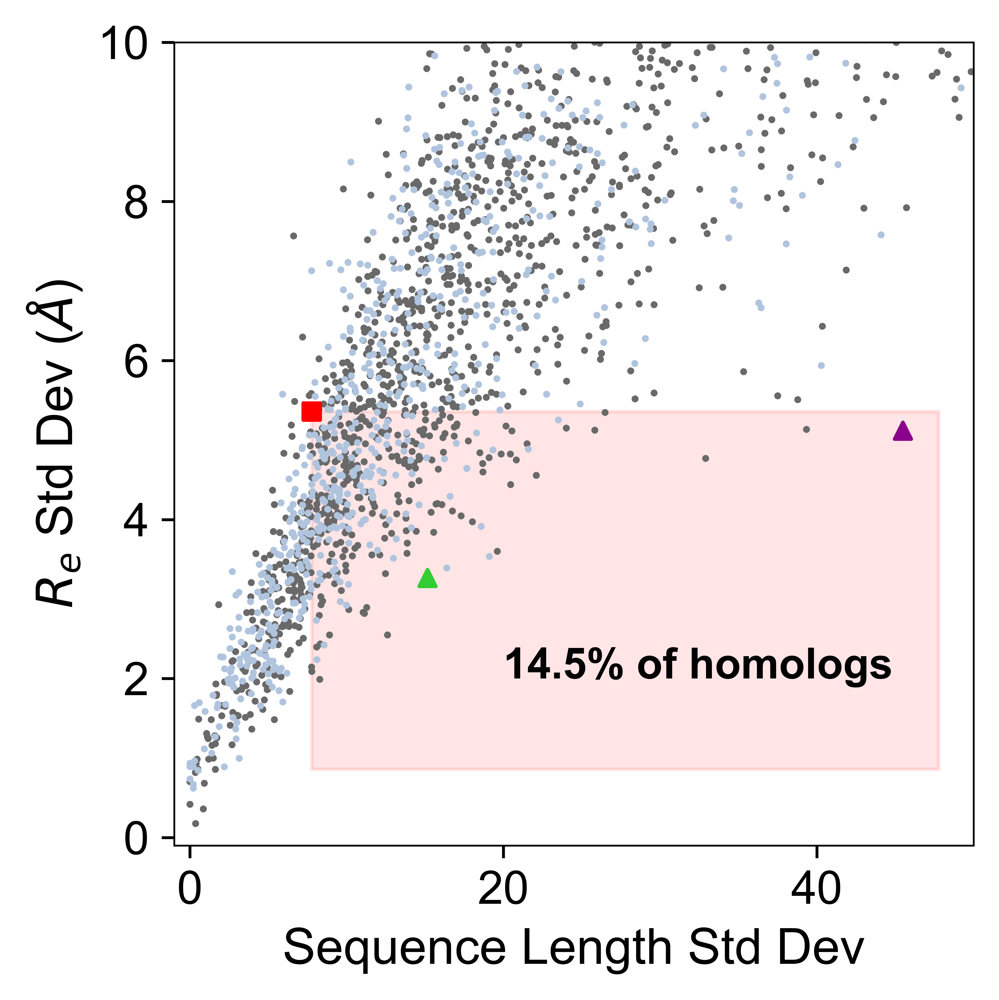

In [45]:
# -- Seq len stddev vs Re stddev (Fig 6B inset)

# Count % of sequences in inset
inset_percent = 100 * len(df.query(f"re_stddev <=  {e1a_re_stddev}").query(f"len_stddev >= {e1a_len_stddev}")) / len(df)

fig, ax = plt.subplots(figsize=(4,4),dpi=500)

# Create a Rectangle patch
rect = patches.Rectangle((e1a_len_stddev, e1a_re_stddev), 40, -4.5, 
                         linewidth=1, edgecolor='r', facecolor='r', alpha=0.1)

# Add the patch to the Axes
ax.add_patch(rect)

for g, c in zip(groups, ['dimgrey', 'lightsteelblue']):
    ix = np.where(df.idr_type == g)[0]
    ax.scatter(df.len_stddev.values[ix], df.re_stddev.values[ix], s=0.9, label=g, 
               color=c, rasterized=True)

ax.scatter(Yak1.len_stddev, Yak1.re_stddev, s=22, label='Yak1', 
           c='darkmagenta', marker='^', rasterized=True)
ax.scatter(Spt2.len_stddev, Spt2.re_stddev, s=22, label='Spt2', 
           c='limegreen', marker='^', rasterized=True)

# E1A linker
ax.scatter(e1a_len_stddev, e1a_re_stddev, s=22, label='E1A', c='red', marker='s', rasterized=True)

# Axis limits
ax.set_ylim([-0.1, 10])
ax.set_xlim([-1, 50])
ax.tick_params(axis='both', which='major', labelsize=13)
plt.xlabel('Sequence Length Std Dev', fontsize=14)
plt.ylabel(r'$R_e$ Std Dev ($\AA$)', fontsize=14)

ax.text(20, 2, "{:.1f}% of homologs".format(inset_percent), fontsize=12, fontweight='bold')

plt.tight_layout()

# save
# with PdfPages('../figures/Re_stddev_vs_seq_length_stddev_wE1A_scatter_inset_Spt2.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()


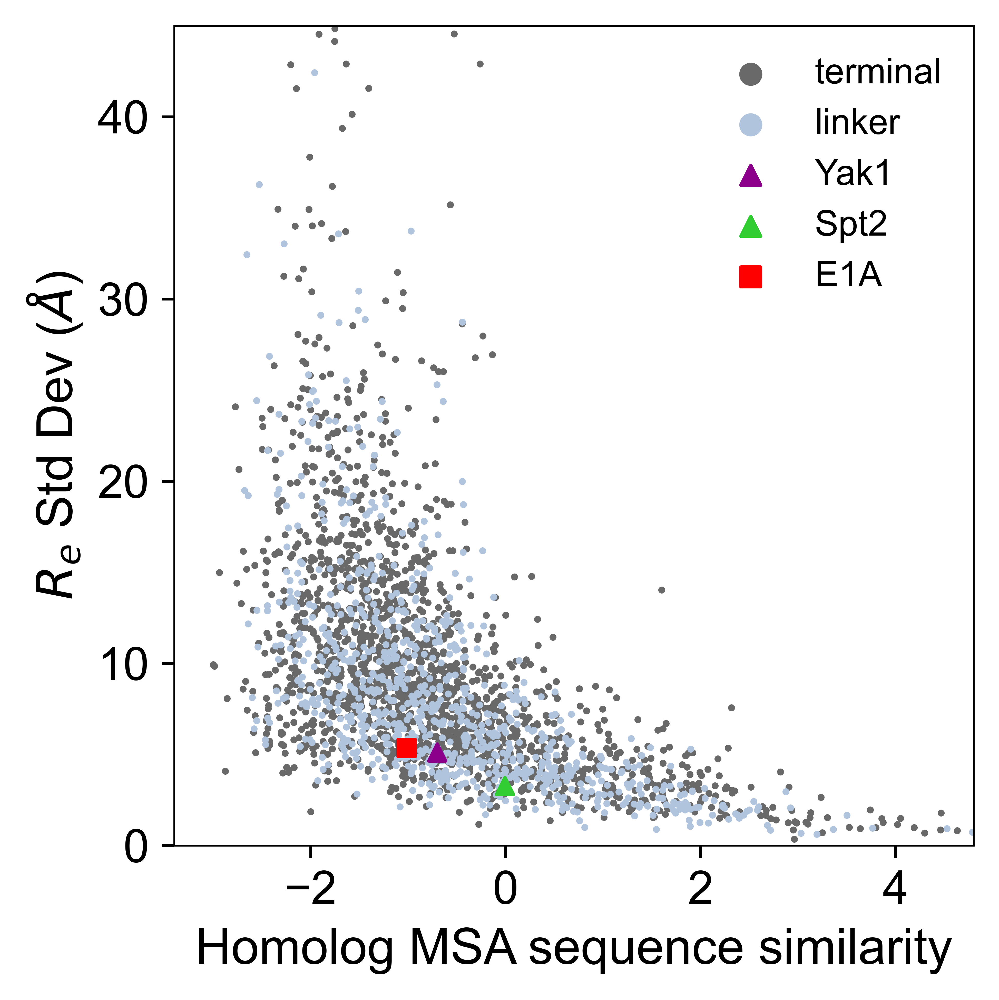

In [46]:
# Sum of Pairs seq similarity vs end-to-end variance (Fig S11 A)

fig, ax = plt.subplots(figsize=(4,4),dpi=500)
for g, c in zip(groups, ['dimgrey', 'lightsteelblue']):
    ix = np.where(df.idr_type == g)[0]
    ax.scatter(df.SumOfPairs.values[ix], df.re_stddev.values[ix], s=0.9, label=g, 
               color=c,rasterized=True)

ax.scatter(Yak1.SumOfPairs, Yak1.re_stddev, s=22, label='Yak1', 
           c='darkmagenta', marker='^', rasterized=True)
ax.scatter(Spt2.SumOfPairs, Spt2.re_stddev, s=22, label='Spt2', 
             c='limegreen', marker='^', rasterized=True)

# E1A linker
ax.scatter(e1a_sop, e1a_re_stddev, s=22, label='E1A', c='red', marker='s', rasterized=True)

ax.set_ylim([0, 45])
ax.set_xlim([-3.4, 4.8])
ax.tick_params(axis='both', which='major', labelsize=13)
plt.xlabel('Homolog MSA sequence similarity', fontsize=14)
plt.ylabel(r'$R_e$ Std Dev ($\AA$)', fontsize=14)

legend = ax.legend(frameon=False)
for legend_handle in legend.legendHandles:
    legend_handle._sizes = [30]

plt.tight_layout()


# save
# with PdfPages('figures/Re_stddev_vs_seq_similarity_wE1A_SoP_scatter_Spt2.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  


plt.show()


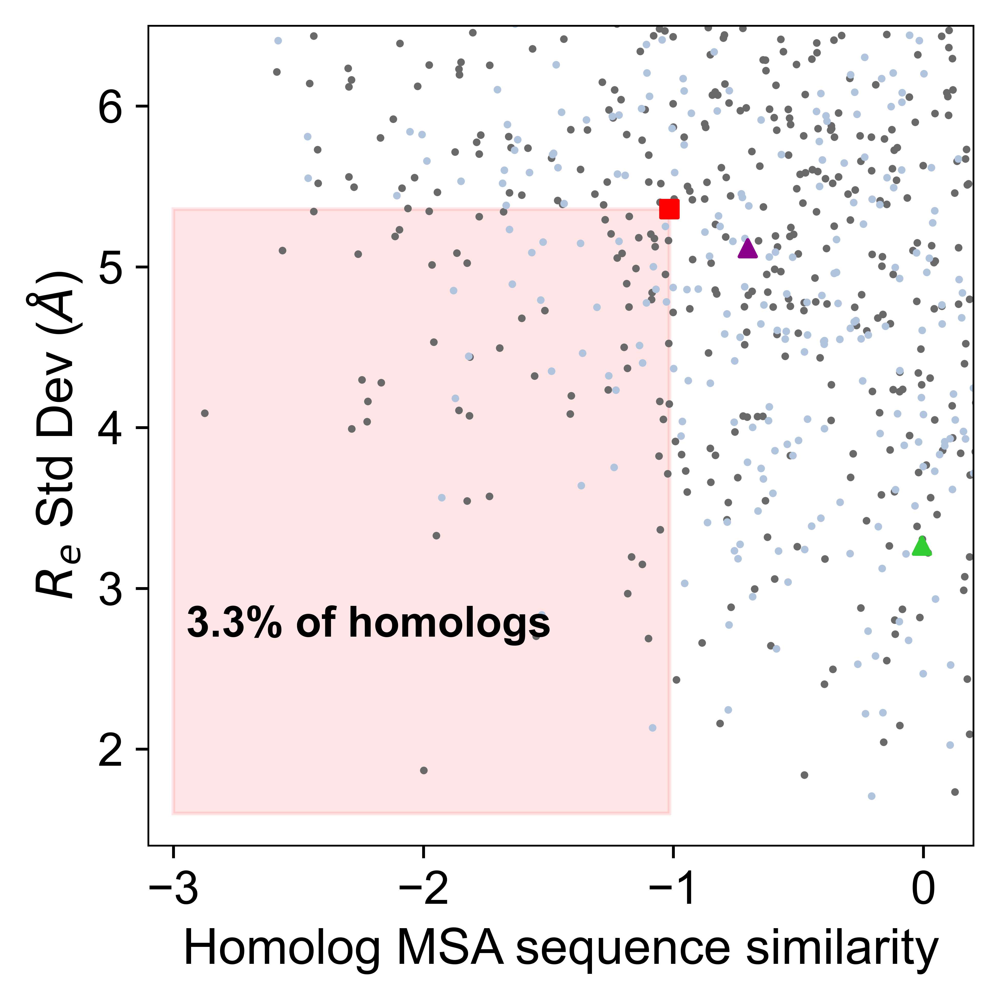

In [47]:
# Fig S11 A inset

# Count % of sequences in inset
inset_percent = 100 * len(df.query(f"re_stddev <=  {e1a_re_stddev}").query(f"SumOfPairs <= {e1a_sop}")) / len(df)

fig, ax = plt.subplots(figsize=(4,4),dpi=500)
# Create a Rectangle patch
rect = patches.Rectangle((-3, 1.6), e1a_sop+3, e1a_re_stddev-1.6, 
                         linewidth=1, edgecolor='r', facecolor='r', alpha=0.1)

# Add the patch to the Axes
ax.add_patch(rect)

# Sum of Pairs seq similarity vs end-to-end variance
for g, c in zip(groups, ['dimgrey', 'lightsteelblue']):
    ix = np.where(df.idr_type == g)[0]
    ax.scatter(df.SumOfPairs.values[ix], df.re_stddev.values[ix], s=1.3, label=g, 
               color=c,rasterized=True)

ax.scatter(Yak1.SumOfPairs, Yak1.re_stddev, s=22, label='Yak1', 
           c='darkmagenta', marker='^', rasterized=True)
ax.scatter(Spt2.SumOfPairs, Spt2.re_stddev, s=22, label='Spt2', 
           c='limegreen', marker='^', rasterized=True)

# E1A linker
ax.scatter(e1a_sop, e1a_re_stddev, s=22, label='E1A', c='red', marker='s', rasterized=True)

ax.set_ylim([1.4, 6.5])
ax.set_xlim([-3.1, 0.2])
ax.tick_params(axis='both', which='major', labelsize=13)
ax.set_xlabel('Homolog MSA sequence similarity', fontsize=14)
ax.set_ylabel(r'$R_e$ Std Dev ($\AA$)', fontsize=14)

ax.text(-2.95, 2.7, "{:.1f}% of homologs".format(inset_percent), fontsize=12, fontweight='bold')
    
plt.tight_layout()

# save
# with PdfPages('figures/Re_stddev_vs_seq_similarity_wE1A_SoP_scatter_inset_Spt2.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()


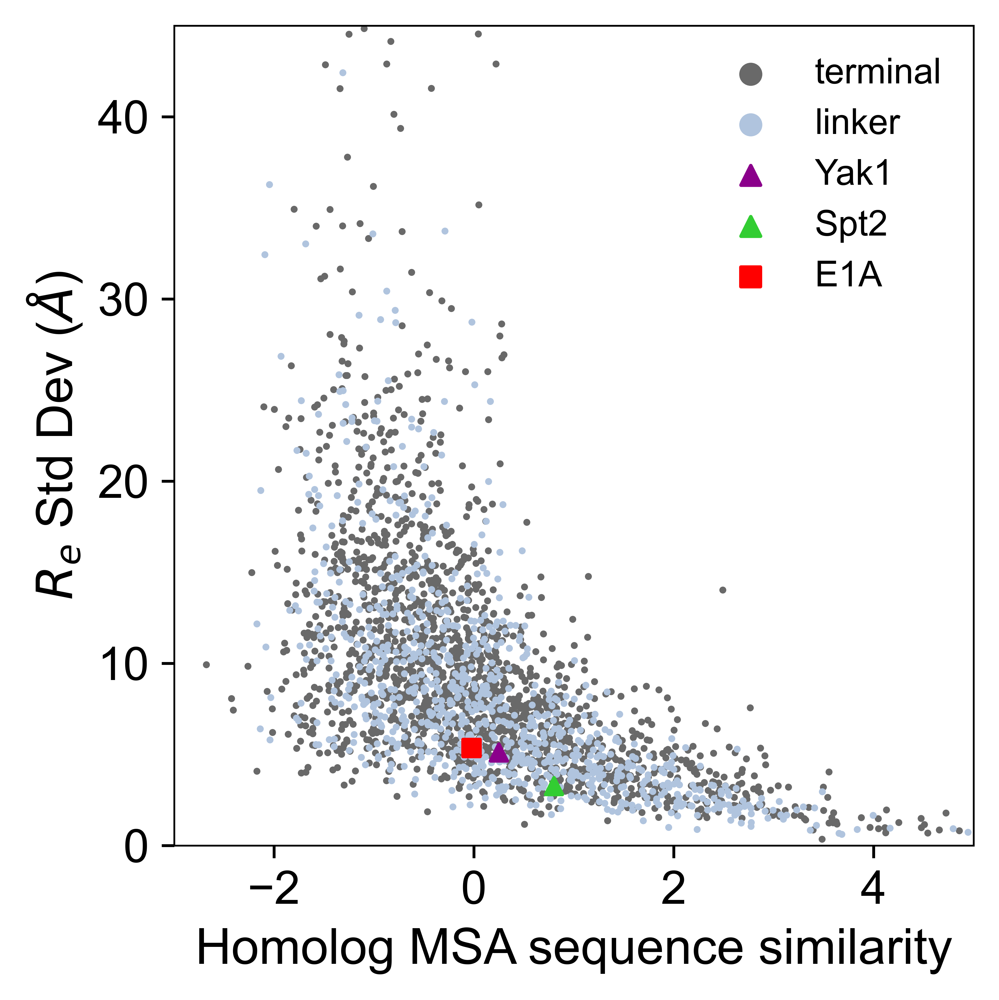

In [48]:
# Star Score seq similarity vs end-to-end variance (Fig S11 B)

fig, ax = plt.subplots(figsize=(4,4),dpi=500)
for g, c in zip(groups, ['dimgrey', 'lightsteelblue']):
    ix = np.where(df.idr_type == g)[0]
    ax.scatter(df.StarScore.values[ix], df.re_stddev.values[ix], s=0.9, label=g, 
               color=c,rasterized=True)

ax.scatter(Yak1.StarScore, Yak1.re_stddev, s=22, label='Yak1', 
           c='darkmagenta', marker='^', rasterized=True)
ax.scatter(Spt2.StarScore, Spt2.re_stddev, s=22, label='Spt2', 
           c='limegreen', marker='^', rasterized=True)

# E1A linker
ax.scatter(e1a_star, e1a_re_stddev, s=22, label='E1A', c='red', marker='s', rasterized=True)

ax.set_ylim([0, 45])
ax.set_xlim([-3, 5])
ax.tick_params(axis='both', which='major', labelsize=13)
plt.xlabel('Homolog MSA sequence similarity', fontsize=14)
plt.ylabel(r'$R_e$ Std Dev ($\AA$)', fontsize=14)

legend = ax.legend(frameon=False)
for legend_handle in legend.legendHandles:
    legend_handle._sizes = [30]

plt.tight_layout()

# save
# with PdfPages('figures/Re_stddev_vs_seq_similarity_wE1A_StarScore_scatter_Spt2.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()

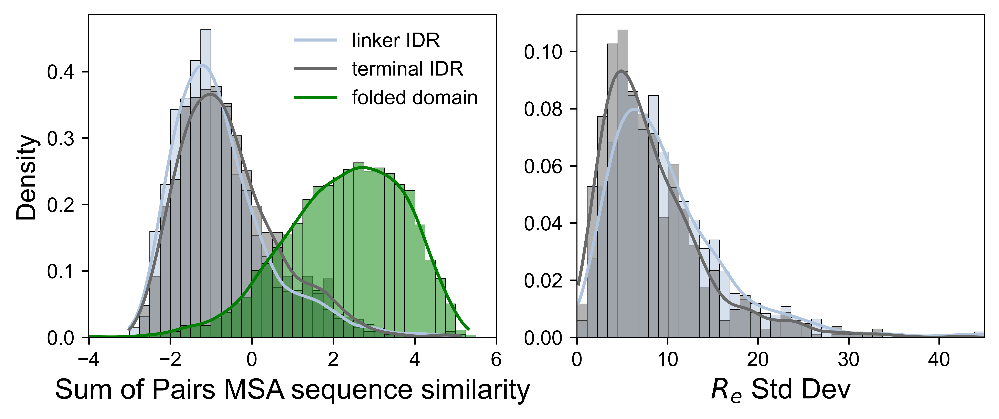

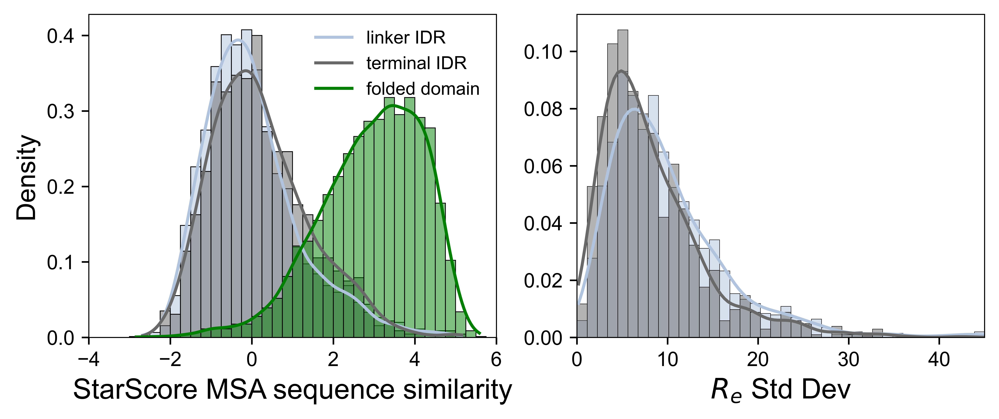

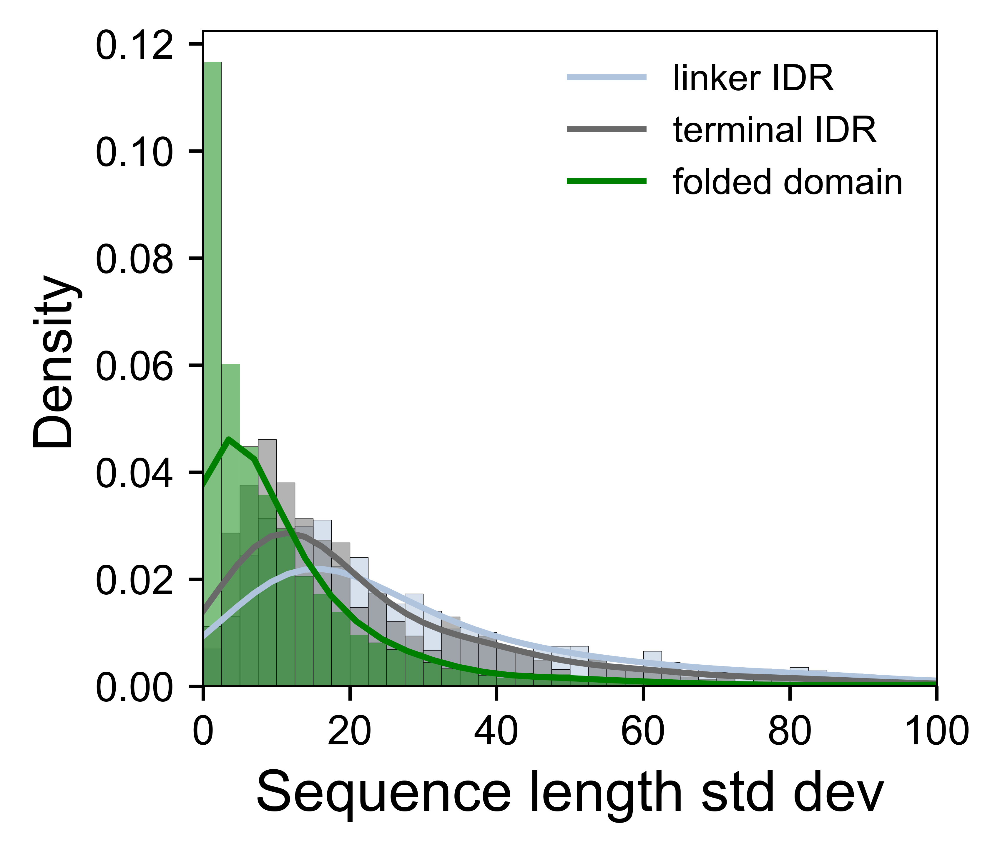

In [49]:
# Histograms for Fig. S12

# --- Sum of Pairs and Re distributions

fig, axs = plt.subplots(1,2, figsize=(7,3), dpi=500)
sns.histplot(data=df, x='SumOfPairs', hue='idr_type', stat='density', common_norm=False, 
             palette=['dimgrey', 'lightsteelblue'], kde=True, bins=40, binrange=[-4,6], ax=axs[0])
sns.histplot(x=fd_sop_scores, stat='density', kde=True, ax=axs[0], color='green', bins=40, binrange=[-4,6], label='FD')

axs[0].set_xlim([-4,6])
axs[0].legend(labels=['linker IDR','terminal IDR','folded domain'], frameon=False)
axs[0].set_ylabel('Density', fontsize=13)
axs[0].set_xlabel('Sum of Pairs MSA sequence similarity', fontsize=14)

sns.histplot(data=df, x='re_stddev', hue='idr_type', stat='density', log_scale=False, common_norm=False, 
             palette=['dimgrey', 'lightsteelblue'], kde=True, bins=40, ax=axs[1], binrange=[0,45], legend=None)
axs[1].set_xlim([0,45])
axs[1].set_ylabel('')
axs[1].set_xlabel(r'$R_e$ Std Dev', fontsize=14)

plt.tight_layout()

# save
# with PdfPages('figures/Re_stddev_and_seq_similarity_SoP_histograms.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()


# --- Star Score distributions

fig, axs = plt.subplots(1,2, figsize=(7,3), dpi=500)
sns.histplot(data=df, x='StarScore', hue='idr_type', stat='density', common_norm=False, kde=True, 
             palette=['dimgrey', 'lightsteelblue'], bins=40, binrange=[-4,6], ax=axs[0])
sns.histplot(x=fd_star_scores, stat='density', kde=True, ax=axs[0], color='green', bins=40, binrange=[-4,6], label='FD')

axs[0].set_xlim([-4,6])
axs[0].legend(labels=['linker IDR','terminal IDR','folded domain'], fontsize=9, frameon=False)
axs[0].set_ylabel('Density', fontsize=13)
axs[0].set_xlabel('StarScore MSA sequence similarity', fontsize=14)

sns.histplot(data=df, x='re_stddev', hue='idr_type', stat='density', log_scale=False, common_norm=False, 
             palette=['dimgrey', 'lightsteelblue'], kde=True, bins=40, ax=axs[1], binrange=[0,45], legend=None)
axs[1].set_xlim([0,45])
axs[1].set_ylabel('')
axs[1].set_xlabel(r'$R_e$ Std Dev', fontsize=14)

plt.tight_layout()

# save
# with PdfPages('figures/Re_stddev_and_seq_similarity_StarScore_histograms.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()


# -- Seq length standard deviation

fig, ax = plt.subplots(1,1, figsize=(3.5,3), dpi=500)
sns.histplot(data=df, x='len_stddev', hue='idr_type', stat='density', common_norm=False, kde=True, 
             palette=['dimgrey', 'lightsteelblue'], bins=40, binrange=[0,100], ax=ax)
sns.histplot(x=fd_len_stddev, stat='density', kde=True, ax=ax, binrange=[0,100], color='green', bins=40, label='FD')

ax.set_xlim([0,100])
ax.legend(labels=['linker IDR','terminal IDR','folded domain'], fontsize=9, frameon=False)
ax.set_ylabel('Density', fontsize=13)
ax.set_xlabel('Sequence length std dev', fontsize=14)

plt.tight_layout()

# save
# with PdfPages('figures/seq_len_stddev_histogram.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  
    

plt.show()


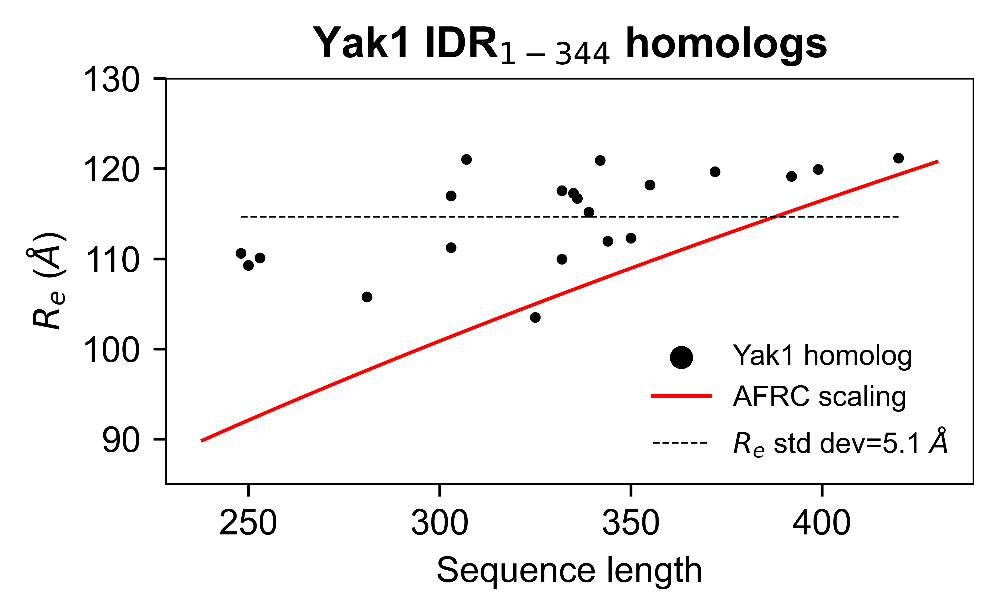

In [50]:
# Individual homolog plots 

# Yak1 (Fig 6C)
seqs = protfasta.read_fasta(f'../fastas/mixed/raw/YJL141C_IDR_terminal_1_344_raw.fasta')

# Get AFRC and ALBATROSS Re predictions
afrc, pred, lengths = get_dim_predictions(seqs, 're')
y = pred

# Plotting domain
domain = np.linspace(min(lengths)-10, max(lengths)+10, 50)

# Get A0s 
a0s = afrc / np.sqrt(lengths)

# Plot
fig, ax = plt.subplots(figsize=(4,2.5), dpi=500)

ax.scatter(lengths, y, s=4, color='k', label=r'Yak1 homolog', rasterized=True)

ax.plot(domain, np.mean(a0s) * np.sqrt(domain), '-', color='red', linewidth=1, label='AFRC scaling')

ax.plot([min(lengths), max(lengths)], [np.mean(y)]*2, 
         'k--', linewidth=0.5, label=r'$R_e$ std dev={:0.1f} $\AA$'.format(np.std(y)))

ax.set_ylabel(r'$R_e$ ($\AA$)')
ax.set_xlabel('Sequence length')
ax.set_ylim([85, 130])

title_str = r'Yak1 IDR$_{1-344}$ homologs'
plt.title(title_str, 
          fontsize=12, fontweight='bold')
legend = ax.legend(fontsize=8, frameon=False)
for legend_handle in legend.legendHandles:
    legend_handle._sizes = [30]
plt.tight_layout()

# save
# with PdfPages('figures/Yak1_Re_vs_length_scatter.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()

In [52]:
# Yak1 sequence features plot (Fig 6D)
lengths = []
kappas = []
fcrs = []
ncprs = []
f_arom = []
f_aliph = []
f_polar = []
f_st = []
f_qn = []
f_proline = []
f_aliph = []

for n, seq in seqs.items():
    prot = sparrow.Protein(seq)

    lengths.append(len(seq))
    kappas.append(prot.kappa)
    fcrs.append(prot.FCR)
    ncprs.append(prot.NCPR)
    f_arom.append(prot.fraction_aromatic)
    f_aliph.append(prot.fraction_aliphatic)
    f_proline.append(prot.fraction_proline)
    f_polar.append(prot.fraction_polar)
    f_st.append(prot.compute_residue_fractions(['S','T']))
    f_qn.append(prot.compute_residue_fractions(['Q','N']))

# --------------------------------------------------------------------

lengths = np.array(lengths)
kappas = np.array(kappas)
fcrs = np.array(fcrs)
ncprs = np.array(ncprs)
f_arom = np.array(f_arom)
f_aliph = np.array(f_aliph)
f_polar = np.array(f_polar)
f_st = np.array(f_st)
f_qn = np.array(f_qn)
f_proline = np.array(f_proline)
f_aliph = np.array(f_aliph)

ncprs = np.abs(np.array(ncprs))

fig, axs = plt.subplots(3,3, figsize=(9,8), dpi=500)

plot_linear_regression(lengths, fcrs, axis=axs[0,0], show=False)
plot_linear_regression(lengths, ncprs, axis=axs[0,1], show=False)
plot_linear_regression(lengths, kappas, axis=axs[0,2], show=False)
plot_linear_regression(lengths, f_proline, axis=axs[1,0], show=False)
plot_linear_regression(lengths, f_arom, axis=axs[1,1], show=False)
plot_linear_regression(lengths, f_aliph, axis=axs[1,2], show=False)
plot_linear_regression(lengths, f_polar, axis=axs[2,0], show=False)
plot_linear_regression(lengths, f_st, axis=axs[2,1], show=False)
plot_linear_regression(lengths, f_qn, axis=axs[2,2], show=False)

axs[0,0].set_xticks([])
axs[0,1].set_xticks([])
axs[0,2].set_xticks([])
axs[1,0].set_xticks([])
axs[1,1].set_xticks([])
axs[1,2].set_xticks([])

axs[0,0].set_ylabel('FCR', fontsize=14)
axs[0,1].set_ylabel('|NCPR|', fontsize=14)
axs[0,2].set_ylabel(r'$\kappa$', fontsize=14)
axs[1,0].set_ylabel('Frac proline', fontsize=14)
axs[1,1].set_ylabel('Frac aromatic', fontsize=14)
axs[1,2].set_ylabel('Frac aliphatic', fontsize=14)
axs[2,0].set_ylabel('Frac polar', fontsize=14)
axs[2,1].set_ylabel('Frac ST', fontsize=14)
axs[2,2].set_ylabel('Frac QN', fontsize=14)

axs[2,0].set_xlabel('Sequence length', fontsize=14)
axs[2,1].set_xlabel('Sequence length', fontsize=14)
axs[2,2].set_xlabel('Sequence length', fontsize=14)

plt.suptitle(r'Yak1 IDR$_{1-344}$ homologs', fontweight='bold', fontsize=20)
plt.tight_layout()

# save
# with PdfPages('figures/Yak1_seq_features_vs_length_scatter.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()

In [53]:
# Yak1 sequences (Table S3)
for name in seqs:
    seq = seqs[name]
    
    pred_re = sparrow.Protein(seq).predictor.end_to_end_distance(use_scaled=True)
    length = len(seq)
    
    print(f'{name}   {length}     {pred_re}')
    sequence_visuals.show_sequence(seq, blocksize=50)


Scerevisiae_YJL141C   344     111.9382060460528


Vpolyspora_Kpol_1060.53   303     111.25034373329567


Vpolyspora_Kpol_2001.10   350     112.28088197989099


Tphaffii_TPHA0A04570   325     103.5030862604816


Tblattae_TBLA0B06510   342     120.92861523437237


Tblattae_TBLA0D05770   372     119.67318879351309


Ndairenensis_NDAI0G06240   420     121.18543556889797


Ncastellii_NCAS0I02680   355     118.18625344870011


Knaganishii_KNAG0C02600   392     119.14739687229344


Kafricana_KAFR0F01940   399     119.93577233782749


Cglabrata_CAGL0I05896g   336     116.69711755031871


Suvarum_Suva_6.221   281     105.77014165424961


Skudriavzevii_Skud_10.73   332     117.55233171375166


Smikatae_Smik_10.91   339     115.16425492938302


Zrouxii_ZYRO0D02970g   335     117.28708861422005


Tdelbrueckii_TDEL0H00890   303     117.00257776048124


Klactis_KLLA0A05819g   307     121.03847262998418


Egossypii_ACR249C   248     110.61443321008483


Lkluyveri_SAKL0C06248g   332     109.95292149872185


Lthermotolerans_KLTH0F05522g   250     109.27133991204487


Lwaltii_Kwal_33.13984   253     110.1000795788634


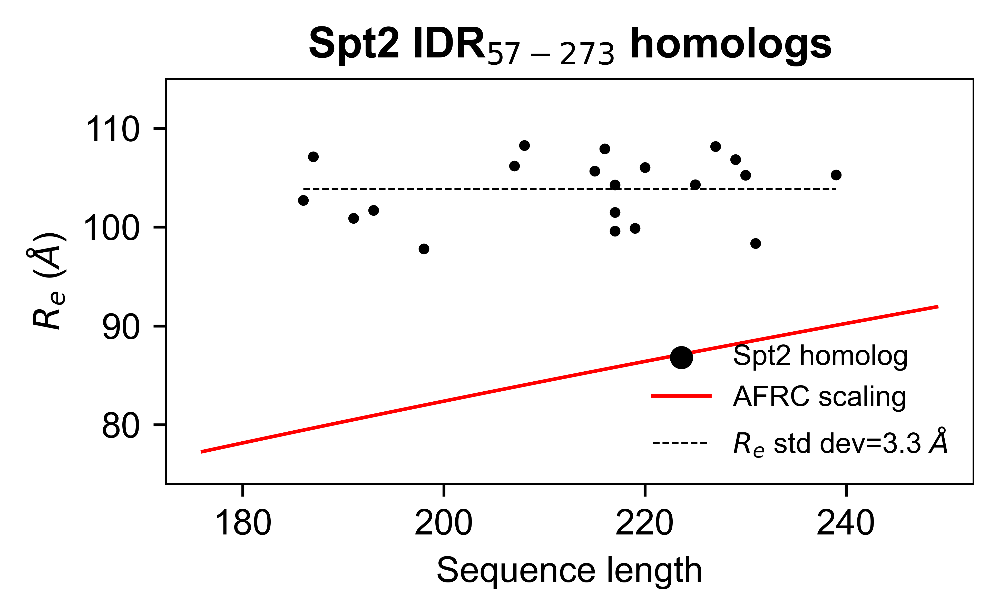

In [54]:
# Spt2 homologs (Fig S14)
# Get sequences
seqs = protfasta.read_fasta(f'../fastas/mixed/raw/YER161C_IDR_linker_57_273_raw.fasta')

# Get AFRC and sparrow Rg predictions
afrc, pred, lengths = get_dim_predictions(seqs, 're')
y = pred

# Plotting domain
domain = np.linspace(min(lengths)-10, max(lengths)+10, 50)

# Get A0s 
a0s = afrc / np.sqrt(lengths)

# Plot
fig, ax = plt.subplots(figsize=(4,2.5), dpi=500)

ax.scatter(lengths, y, s=4, color='k', label='Spt2 homolog', rasterized=True)
ax.plot(domain, np.mean(a0s) * np.sqrt(domain), '-', color='red', linewidth=1, label='AFRC scaling')

ax.plot([min(lengths), max(lengths)], [np.mean(y)]*2, 
         'k--', linewidth=0.5, label=r'$R_e$ std dev={:0.1f} $\AA$'.format(np.std(y)))

ax.set_ylabel(r'$R_e$ ($\AA$)')
ax.set_xlabel('Sequence length')
ax.set_ylim([74, 115])

title_str = r'Spt2 IDR$_{57-273}$ homologs'
plt.title(title_str, 
          fontsize=12, fontweight='bold')
legend = ax.legend(loc='lower right', fontsize=8, frameon=False)
for legend_handle in legend.legendHandles:
    legend_handle._sizes = [30]

plt.tight_layout()

# save
# with PdfPages('figures/Spt2_Re_vs_length_scatter.pdf') as pdf:
#     pdf.savefig(fig, dpi=500)  

plt.show()

In [56]:
# Sequence features plot (Fig S14)

lengths = []
kappas = []
fcrs = []
ncprs = []
f_arom = []
f_aliph = []
f_polar = []
f_st = []
f_qn = []
f_proline = []
f_aliph = []

for n, seq in seqs.items():
    prot = sparrow.Protein(seq)
    lengths.append(len(seq))
    kappas.append(prot.kappa)
    fcrs.append(prot.FCR)
    ncprs.append(prot.NCPR)
    f_arom.append(prot.fraction_aromatic)
    f_aliph.append(prot.fraction_aliphatic)
    f_proline.append(prot.fraction_proline)
    f_polar.append(prot.fraction_polar)
    f_st.append(prot.compute_residue_fractions(['S','T']))
    f_qn.append(prot.compute_residue_fractions(['Q','N']))


# --------------------------------------------------------------------

lengths = np.array(lengths)
kappas = np.array(kappas)
fcrs = np.array(fcrs)
ncprs = np.array(ncprs)
f_arom = np.array(f_arom)
f_aliph = np.array(f_aliph)
f_polar = np.array(f_polar)
f_st = np.array(f_st)
f_qn = np.array(f_qn)
f_proline = np.array(f_proline)
f_aliph = np.array(f_aliph)

ncprs = np.abs(np.array(ncprs))

fig, axs = plt.subplots(3,3, figsize=(9,8), dpi=500)

plot_linear_regression(lengths, fcrs, axis=axs[0,0], show=False)
plot_linear_regression(lengths, ncprs, axis=axs[0,1], show=False)
plot_linear_regression(lengths, kappas, axis=axs[0,2], show=False)
plot_linear_regression(lengths, f_proline, axis=axs[1,0], show=False)
plot_linear_regression(lengths, f_arom, axis=axs[1,1], show=False)
plot_linear_regression(lengths, f_aliph, axis=axs[1,2], show=False)
plot_linear_regression(lengths, f_polar, axis=axs[2,0], show=False)
plot_linear_regression(lengths, f_st, axis=axs[2,1], show=False)
plot_linear_regression(lengths, f_qn, axis=axs[2,2], show=False)

axs[0,0].set_xticks([])
axs[0,1].set_xticks([])
axs[0,2].set_xticks([])
axs[1,0].set_xticks([])
axs[1,1].set_xticks([])
axs[1,2].set_xticks([])

axs[0,0].set_ylabel('FCR', fontsize=14)
axs[0,1].set_ylabel('|NCPR|', fontsize=14)
axs[0,2].set_ylabel(r'$\kappa$', fontsize=14)
axs[1,0].set_ylabel('Frac proline', fontsize=14)
axs[1,1].set_ylabel('Frac aromatic', fontsize=14)
axs[1,2].set_ylabel('Frac aliphatic', fontsize=14)
axs[2,0].set_ylabel('Frac polar', fontsize=14)
axs[2,1].set_ylabel('Frac ST', fontsize=14)
axs[2,2].set_ylabel('Frac QN', fontsize=14)

axs[2,0].set_xlabel('Sequence length', fontsize=14)
axs[2,1].set_xlabel('Sequence length', fontsize=14)
axs[2,2].set_xlabel('Sequence length', fontsize=14)

plt.suptitle(r'Spt2 IDR$_{57-273}$ homologs', fontweight='bold', fontsize=20)
plt.tight_layout()

# save
# with PdfPages('figures/Spt2_seq_features_vs_length_scatter.pdf') as pdf:
#     pdf.savefig(fig, dpi=500) 

plt.show()

In [57]:
# Spt2 sequences with Re (Table S4)
for name in seqs:
    seq = seqs[name]
    
    pred_re = sparrow.Protein(seq).predictor.end_to_end_distance(use_scaled=True)
    length = len(seq)
    
    print(f'{name}   {length}     {pred_re}')
    sequence_visuals.show_sequence(seq, blocksize=50)


Scerevisiae_YER161C   217     99.58621958817025


Vpolyspora_Kpol_1025.5   231     98.33533109154679


Tphaffii_TPHA0B03460   225     104.29409980773926


Tblattae_TBLA0F03750   239     105.26481425226365


Ndairenensis_NDAI0C06050   229     106.83958120812436


Ncastellii_NCAS0A03730   230     105.24639973911323


Knaganishii_KNAG0G01760   187     107.12361935258497


Kafricana_KAFR0B02460   208     108.26423354097969


Cglabrata_CAGL0L11704g   216     107.92926821429566


Suvarum_Suva_5.295   219     99.88814002223548


Skudriavzevii_Skud_5.300   217     104.27209673983974


Smikatae_Smik_5.333   217     101.49264317417835


Zrouxii_ZYRO0B11550g   227     108.17014061513571


Tdelbrueckii_TDEL0A01380   220     106.0379188622319


Klactis_KLLA0F14487g   186     102.69933491648831


Egossypii_AGR161C   215     105.67127743967409


Ecymbalariae_Ecym_7222   207     106.18260670029599


Lkluyveri_SAKL0H18084g   198     97.79383067942162


Lthermotolerans_KLTH0G14586g   193     101.70455012355588


Lwaltii_Kwal_56.23413   191     100.90290329857255
